In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
comments=pd.read_csv(r'E:\DA Projects\1-Youtube Text Data Analysis-20211213T202510Z-001\1-Youtube Text Data Analysis/GBcomments.csv',error_bad_lines=False)

C:\Users\navee\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version.


  exec(code_obj, self.user_global_ns, self.user_ns)
b'Skipping line 113225: expected 4 fields, saw 5\n'
b'Skipping line 158379: expected 4 fields, saw 7\nSkipping line 241590: expected 4 fields, saw 5\nSkipping line 245637: expected 4 fields, saw 7\n'
b'Skipping line 521402: expected 4 fields, saw 5\n'


In [6]:
comments.head()

,video_id,comment_text,likes,replies
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0


In [7]:
!pip install textblob

In [8]:
from textblob import TextBlob

In [9]:
TextBlob('Its more accurate to call it the M+ (1000) be..').sentiment.polarity

0.45000000000000007

In [10]:
comments.isna().sum()

video_id         0
comment_text    28
likes            0
replies          0
dtype: int64

In [11]:
comments.dropna(inplace=True)

In [12]:
polarity=[]
for i in comments['comment_text']:
    polarity.append(TextBlob(i).sentiment.polarity) 


In [13]:
comments['polarity']=polarity

In [14]:
comments.head(20)

,video_id,comment_text,likes,replies,polarity
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,0.450000
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,0.000000
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,0.000000
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,0.000000
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.000000
5,jt2OHQh0HoQ,Keep calm and buy iphone 8 Keep calm and buy i...,0,0,0.300000
6,jt2OHQh0HoQ,i am a big fan of youtube and u !!!!!!!!!!!!!,0,0,0.000000
7,jt2OHQh0HoQ,You will never find Losers who line up and pay...,0,0,-0.100000
8,jt2OHQh0HoQ,*APPLE JUST COMMENTED ON MY LAST VIDEO* I'm cr...,0,0,0.028571
9,jt2OHQh0HoQ,"I'm only here to see Emma, I love her so much!...",0,0,0.500000


In [15]:
comments_positive=comments[comments['polarity']==1]

In [16]:
comments_positive.shape

(20400, 5)

In [17]:
comments_positive.head()

,video_id,comment_text,likes,replies,polarity
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.0
26,jt2OHQh0HoQ,The best thing to ever happen to iPhone,0,2,1.0
80,jt2OHQh0HoQ,Apple is always awesome \n\nhttps://youtu.be/r...,0,1,1.0
158,YPVcg45W0z4,das a lot of edditing you have done there ... ...,0,0,1.0
175,YPVcg45W0z4,Welcome to the Scandiworld!,0,0,1.0


In [18]:
!pip install wordcloud

In [19]:
from wordcloud import WordCloud,STOPWORDS

In [20]:
stopwords=set(STOPWORDS)

In [21]:
total_comments=' '.join(comments_positive['comment_text'])

In [22]:
wordcloud=WordCloud(width=1000,height=500,stopwords=stopwords).generate(total_comments)

(-0.5, 999.5, 499.5, -0.5)

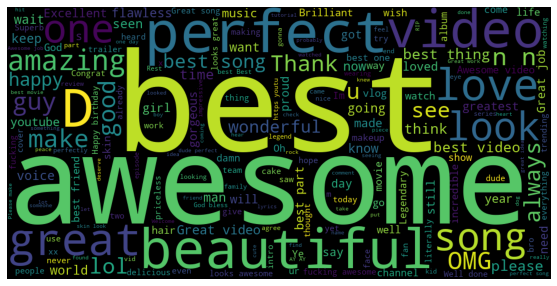

In [23]:
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')

In [24]:
comments_negative=comments[comments['polarity']==-1]

In [25]:
total_comments=' '.join(comments_negative['comment_text'])

In [26]:
wordcloud=WordCloud(width=1000,height=500,stopwords=stopwords).generate(total_comments)

(-0.5, 999.5, 499.5, -0.5)

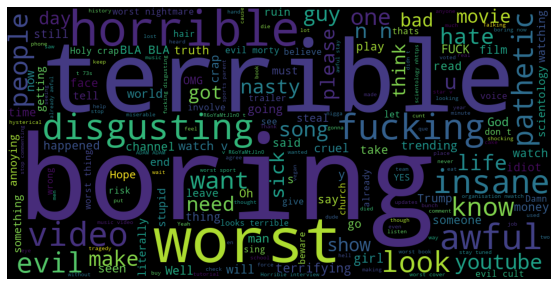

In [27]:
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')

In [28]:
videos=pd.read_csv(r'E:\DA Projects\1-Youtube Text Data Analysis-20211213T202510Z-001\1-Youtube Text Data Analysis/USvideos.csv',error_bad_lines=False)

C:\Users\navee\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version.


  exec(code_obj, self.user_global_ns, self.user_ns)
b'Skipping line 2401: expected 11 fields, saw 21\nSkipping line 2800: expected 11 fields, saw 21\nSkipping line 5297: expected 11 fields, saw 12\nSkipping line 5299: expected 11 fields, saw 12\nSkipping line 5300: expected 11 fields, saw 12\nSkipping line 5301: expected 11 fields, saw 12\n'


In [29]:
videos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,thumbnail_link,date
0,XpVt6Z1Gjjo,1 YEAR OF VLOGGING -- HOW LOGAN PAUL CHANGED Y...,Logan Paul Vlogs,24,logan paul vlog|logan paul|logan|paul|olympics...,4394029,320053,5931,46245,https://i.ytimg.com/vi/XpVt6Z1Gjjo/default.jpg,13.09
1,K4wEI5zhHB0,iPhone X — Introducing iPhone X — Apple,Apple,28,Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lig...,7860119,185853,26679,0,https://i.ytimg.com/vi/K4wEI5zhHB0/default.jpg,13.09
2,cLdxuaxaQwc,My Response,PewDiePie,22,[none],5845909,576597,39774,170708,https://i.ytimg.com/vi/cLdxuaxaQwc/default.jpg,13.09
3,WYYvHb03Eog,Apple iPhone X first look,The Verge,28,apple iphone x hands on|Apple iPhone X|iPhone ...,2642103,24975,4542,12829,https://i.ytimg.com/vi/WYYvHb03Eog/default.jpg,13.09
4,sjlHnJvXdQs,iPhone X (parody),jacksfilms,23,jacksfilms|parody|parodies|iphone|iphone x|iph...,1168130,96666,568,6666,https://i.ytimg.com/vi/sjlHnJvXdQs/default.jpg,13.09


In [30]:
videos['tags']

0       logan paul vlog|logan paul|logan|paul|olympics...
1       Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lig...
2                                                  [none]
3       apple iphone x hands on|Apple iPhone X|iPhone ...
4       jacksfilms|parody|parodies|iphone|iphone x|iph...
                              ...                        
7987    sinkhole|how do sinkholes form|sinkhole in wat...
7988    Business Insider|Donald Trump|Hillary Clinton|...
7989    LP|Death Valley|Other People|Lost On You|The M...
7990    YouTube FanFest|#YTFF|Washington DC|USA|YTFF|#...
7991    LIGO|Virgo|collaboration|space|science|nationa...
Name: tags, Length: 7992, dtype: object

In [31]:
' '.join(videos['tags'])

"logan paul vlog|logan paul|logan|paul|olympics|logan paul youtube|vlog|daily|comedy|hollywood|parrot|maverick|bird|maverick clothes|diamond play button|logan paul diamond play button|10M subscribers|logan paul 1 year vlogging|1 year vlog|dwarf mamba play button|logan paul history|youtube history|10M|10M plaque|youtube button|diamond button|logang|logang 4 life Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lighting|A11 Bionic|augmented reality|emoji|animoji|Face ID|Apple Pay|camera|smartphone [none] apple iphone x hands on|Apple iPhone X|iPhone X|apple iphone x first look|iPhone X first look|apple iphone x event 2017|apple iphone x event|iPhone X price|iPhone X specs|iPhone X design|iPhone X camera|iPhone X home button|iPhone X wireless charging|iPhone X waterproof|iPhone X release date|iphone 2017|apple|iphone|ios 11|the verge|verge jacksfilms|parody|parodies|iphone|iphone x|iphone 8|apple|emoji a24|a24 films|a24 trailers|independent films|trailer|HD|official|movie|film|a24 movies|oscar 

In [32]:
tags_complete=' '.join(videos['tags'])

In [33]:
tags_complete

"logan paul vlog|logan paul|logan|paul|olympics|logan paul youtube|vlog|daily|comedy|hollywood|parrot|maverick|bird|maverick clothes|diamond play button|logan paul diamond play button|10M subscribers|logan paul 1 year vlogging|1 year vlog|dwarf mamba play button|logan paul history|youtube history|10M|10M plaque|youtube button|diamond button|logang|logang 4 life Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lighting|A11 Bionic|augmented reality|emoji|animoji|Face ID|Apple Pay|camera|smartphone [none] apple iphone x hands on|Apple iPhone X|iPhone X|apple iphone x first look|iPhone X first look|apple iphone x event 2017|apple iphone x event|iPhone X price|iPhone X specs|iPhone X design|iPhone X camera|iPhone X home button|iPhone X wireless charging|iPhone X waterproof|iPhone X release date|iphone 2017|apple|iphone|ios 11|the verge|verge jacksfilms|parody|parodies|iphone|iphone x|iphone 8|apple|emoji a24|a24 films|a24 trailers|independent films|trailer|HD|official|movie|film|a24 movies|oscar 

In [34]:
import re

In [35]:
tags=re.sub('[^a-zA-Z]',' ',tags_complete)

In [36]:
tags

'logan paul vlog logan paul logan paul olympics logan paul youtube vlog daily comedy hollywood parrot maverick bird maverick clothes diamond play button logan paul diamond play button   M subscribers logan paul   year vlogging   year vlog dwarf mamba play button logan paul history youtube history   M   M plaque youtube button diamond button logang logang   life Apple iPhone    iPhone Ten iPhone Portrait Lighting A   Bionic augmented reality emoji animoji Face ID Apple Pay camera smartphone  none  apple iphone x hands on Apple iPhone X iPhone X apple iphone x first look iPhone X first look apple iphone x event      apple iphone x event iPhone X price iPhone X specs iPhone X design iPhone X camera iPhone X home button iPhone X wireless charging iPhone X waterproof iPhone X release date iphone      apple iphone ios    the verge verge jacksfilms parody parodies iphone iphone x iphone   apple emoji a   a   films a   trailers independent films trailer HD official movie film a   movies oscar 

In [37]:
tags=re.sub(' +',' ',tags)

In [38]:
wordcloud=WordCloud(width=1000, height= 500, stopwords=set(STOPWORDS)).generate(tags)

(-0.5, 999.5, 499.5, -0.5)

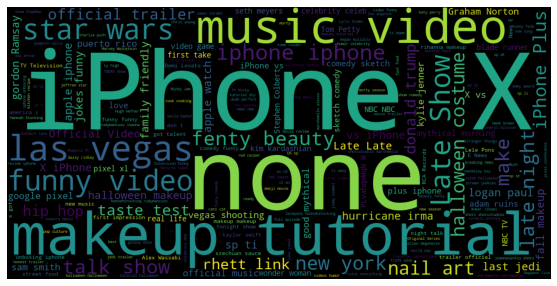

In [39]:
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')

Text(0.5, 1.0, 'Regression plot for views & likes')

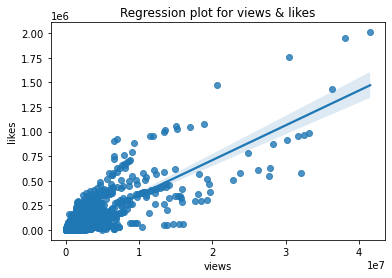

In [40]:
sns.regplot(data=videos,x='views', y='likes')
plt.title('Regression plot for views & likes')

Text(0.5, 1.0, 'Regression plot for views & dislikes')

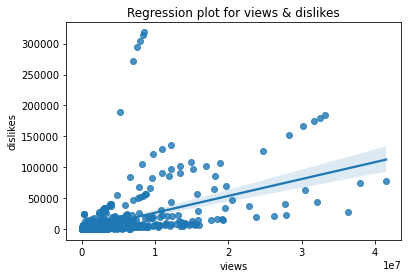

In [41]:
sns.regplot(data=videos,x='views', y='dislikes')
plt.title('Regression plot for views & dislikes')

In [42]:
df_corr=videos[['views','likes','dislikes']]

In [43]:
df_corr.corr()

,views,likes,dislikes
views,1.000000,0.832844,0.541955
likes,0.832844,1.000000,0.497439
dislikes,0.541955,0.497439,1.000000


<AxesSubplot:>

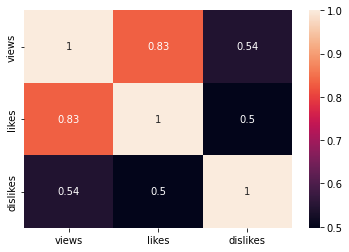

In [44]:
sns.heatmap(df_corr.corr(),annot=True)

In [45]:
comments.head()

,video_id,comment_text,likes,replies,polarity
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,0.45
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,0.00
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,0.00
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,0.00
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.00


In [46]:
print('\u10001F600')

က1F600


In [47]:
!pip install emoji

In [48]:
import emoji

In [49]:
len(comments)

718424

In [50]:
comment=comments['comment_text'][1]

In [51]:
[c for c in comment if c in emoji.UNICODE_EMOJI_ENGLISH]

['😂', '😂', '😂']

In [52]:
str=''
for i in comments['comment_text']:
    list=[c for c in i if c in emoji.UNICODE_EMOJI_ENGLISH]
    for ele in list:
        str=str+ele

In [53]:
len(str)

333278

In [54]:
str

'😂😂😂😭😭😭😢😢😢❤❤😂👏👇👇👇👇👇👇👇👇👇👇🌞😎😣😥😫😭✌😂👎🏻👎🏻👎🏻👎🏻😂🖕😘😘▶⏭⏮◀🔥🔥😊😊🤔🤔😂😂😂😂👏🏻👏🏻❤❤😜😍😍😅❤😍😍✌😂😂😂😊😂😂😂😂😏😏😭💔😊❤❤❤❤❤😂😂😊❤😂🤣✨🌈😘😂😂❤😊😂😊😂💗😂😊😊😊💖🐢😉😍😂😂💗💗😻😻❤😂😂❤❤🤗👌🏼👌🏼😂😂😂😂💖😩🙊♥♥♥😂😂😂💙💙💙💙💙💙😂😂😂❤❤❤😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😱😊😛🌳🌽🎃🚣🚂😂😂😊😕😋🤣😅😢💔😂😊🤡🙏🙏🙏👊🏿🙇🏽👋😅😅😅😅😂😂🤔😎😎😎😎😎😎😎😍😍😍😍😍😍😘😘😘😘😘😘😘😲🖕💪🤘💓☺☺😂😂😂💕😄😄😍💕😉😩❤❤💕❤😂💕😍💗👫💖😆💕💖💕😍😍😊😄😍😀💗🦄😍😊😂😊👍😍♥❤😂👶🏻🤗☺😘💙💙💙😍😍😊😎🤘🖤👌👌😍😂👌🍍😎😎😄😄😄😄😂😂😂😬💜💜💜😭😂😍😍💖😂😂😂😂😂😂😂😭😂😭😂😭😂😂😂😍😍😍😭😍😍😂👀👀🤔😂😂😂😂😂😂😂😂😂😂🍸🍸🍸🍸🍸😂😂😂🤣🤣🤣😂😂😂😂😍💜💜💜💜😂😂😂😅😂😍💖😂😻😉🔥❤😻❤😭😭😭😭😭😭😭👍🏻😍💚💙❤❤😫❤❤❤❤❤♥😍❤😊😍😎💄🐐😅😂😂😊😊👀👌🏽❤❤❤😂💖🎉💪💪🏽😎🙌🙌😜❤❤💛💛😎🙏💚🎉🎉❤🎉🎉🎉🎉🎊🎉🎊🎉😭💗😍😍😍😍😍😍😍👏✌😁❤❤😂💋💋👫💘😻💋💋😂👑🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥😂😐😑😩👌🏻🔥💖👏🏻👀✨👅💦💕❤😍🔥🔥🔥❤❤❤❤❤❤❤👌😍😍😍😞🌴💜💜💜💜😍😍😍😍😍❤❤❤❤❤😊❤❤❤❤🍔🍟😒🌿😄😄😄😉🍲🍱🎏❤💪👊🏽😘😂😂😂❤🙋☺😍😍😚💕😉😂❤❤😊☺💓🌸🙄🙄🙄🙁😞😊🙄😍😨😍😍😍😍😎😃😂😍😏😌😂😎🤑😂😉👍🏻🔥💯🚨😊☺😂😂😂🤣🙂❤❤😀😀😀♥♥😂❤😂😓😭😂❤❤😖😖😂😂😂💗💝😘💐💐💐😂😍☺😂❤😭💕🙌🏽🙌🏽🙌🏽😘😘❤❤💖😫😖📱😂😏🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗😁🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗😎😂😂👍🏼💯💕♥♥♥😱😱😱❤❤❤😍😍😩😩😩😩😩😩😩😍😻😻😻😻😻😳🥀♥♥♥♥♥♥😍😍😍🙃😂💕💕💕😍💕💕❤❤💕😍🍫🌹💖❤😍👸🏿👸🏿👸🏿👸🏿👸🏿💗😊😊😩❤👌🏼😻😊😍❤😂😂👏🏼❤❤❤❤❤😍😍😍💚💚💚💚💚😍😭🌹😍❤😍😍😍💚💚💚💚💚😍💚💚💚☺💙😀😍💚😕😍👌😂😂😂😍👌🏻💗❤💚💚💚😸😙😙😘💚💚💚💚😍😭😭💖💓💓💓😍❤😘😘🤗🤗🤗❤😀😀💓💓💓❤😂❤😍❤❤♥♥♥❤🙌❤😂❤❤😍❤💜😍😭😍😍😍😊💗💕😍❤💗💗💛💛💛💖💖😍😐😍😍😍😍🗿😂🤗😩😩😩💖💖💖❤❤❤❤❤😍😍✨😍👍🏻😁😂😍💅❤😘❤❤😈👀😄😈👍☝👆✊👌✌👊✋👋👏👐👉👈💔😂😂😬😭😥☺😂😂😂😂😍😍😍😜😂😂😂😂😂😒👎🏽😱😱😱😱😂😎😛🙊✊✌😑😑😑👌😊😊😍😊❤❤❤❤😍

In [55]:
result={}
for i in set(str):
    result[i]=str.count(i)

In [56]:
result

{'🚳': 10,
 '🐫': 22,
 '🌅': 38,
 '🥑': 13,
 '🚴': 8,
 '😍': 34856,
 '🦎': 8,
 '🌦': 19,
 '🕓': 11,
 '📑': 8,
 '⚖': 12,
 '◼': 19,
 '❎': 5,
 '🚪': 16,
 '🙁': 210,
 '〽': 31,
 '🍀': 68,
 '♣': 23,
 '🎧': 183,
 '⏰': 8,
 '🔡': 5,
 '🛵': 9,
 '▫': 69,
 '🍺': 48,
 '🎨': 33,
 '💆': 21,
 '❄': 178,
 '😰': 261,
 '🆘': 10,
 '🎱': 12,
 '🚥': 8,
 '🔢': 5,
 '🆑': 8,
 '📉': 36,
 '😚': 583,
 '🤷': 329,
 '🚠': 5,
 '♎': 24,
 '😁': 2504,
 '◻': 5,
 '💊': 25,
 '🏟': 12,
 '☁': 71,
 '🔧': 19,
 '🤽': 1,
 '🚬': 35,
 '📂': 28,
 '💶': 64,
 '🛏': 7,
 '🏳': 92,
 '🍦': 48,
 '🥋': 6,
 '🔽': 7,
 '🤜': 17,
 '🍪': 75,
 '🖌': 6,
 '🐵': 21,
 '⛔': 14,
 '🎬': 35,
 '🍔': 54,
 '😿': 127,
 '🙂': 528,
 '🏑': 12,
 'ℹ': 5,
 '👪': 13,
 '🙆': 158,
 '🗽': 23,
 '🦅': 19,
 '🤟': 1,
 '⛈': 15,
 '🥚': 1,
 '🖕': 1019,
 '📅': 12,
 '⚾': 5,
 '⬇': 23,
 '🐝': 143,
 '⤵': 6,
 '🍟': 49,
 '📗': 9,
 '🛃': 6,
 '📱': 226,
 '🍸': 60,
 '🍤': 16,
 '🆙': 13,
 '🌝': 53,
 '💹': 4,
 '👵': 26,
 '🍷': 58,
 '😘': 6334,
 '💱': 24,
 '🐣': 98,
 '🛒': 1,
 '🕳': 8,
 '🔈': 7,
 '🚾': 6,
 '🗺': 14,
 '🎞': 8,
 '🕚': 618,
 '🛢': 4,
 '💐': 118,
 '🌏': 32,

In [57]:
result.items()

dict_items([('🚳', 10), ('🐫', 22), ('🌅', 38), ('🥑', 13), ('🚴', 8), ('😍', 34856), ('🦎', 8), ('🌦', 19), ('🕓', 11), ('📑', 8), ('⚖', 12), ('◼', 19), ('❎', 5), ('🚪', 16), ('🙁', 210), ('〽', 31), ('🍀', 68), ('♣', 23), ('🎧', 183), ('⏰', 8), ('🔡', 5), ('🛵', 9), ('▫', 69), ('🍺', 48), ('🎨', 33), ('💆', 21), ('❄', 178), ('😰', 261), ('🆘', 10), ('🎱', 12), ('🚥', 8), ('🔢', 5), ('🆑', 8), ('📉', 36), ('😚', 583), ('🤷', 329), ('🚠', 5), ('♎', 24), ('😁', 2504), ('◻', 5), ('💊', 25), ('🏟', 12), ('☁', 71), ('🔧', 19), ('🤽', 1), ('🚬', 35), ('📂', 28), ('💶', 64), ('🛏', 7), ('🏳', 92), ('🍦', 48), ('🥋', 6), ('🔽', 7), ('🤜', 17), ('🍪', 75), ('🖌', 6), ('🐵', 21), ('⛔', 14), ('🎬', 35), ('🍔', 54), ('😿', 127), ('🙂', 528), ('🏑', 12), ('ℹ', 5), ('👪', 13), ('🙆', 158), ('🗽', 23), ('🦅', 19), ('🤟', 1), ('⛈', 15), ('🥚', 1), ('🖕', 1019), ('📅', 12), ('⚾', 5), ('⬇', 23), ('🐝', 143), ('⤵', 6), ('🍟', 49), ('📗', 9), ('🛃', 6), ('📱', 226), ('🍸', 60), ('🍤', 16), ('🆙', 13), ('🌝', 53), ('💹', 4), ('👵', 26), ('🍷', 58), ('😘', 6334), ('💱', 24), ('🐣

In [58]:
final={}
for key,value in sorted(result.items(),key =lambda item:item[1]):
    final[key]=value

In [59]:
final

{'🤽': 1,
 '🤟': 1,
 '🥚': 1,
 '🛒': 1,
 '🧠': 1,
 '🤺': 1,
 '🥡': 1,
 '🧤': 1,
 '🤾': 1,
 '🥟': 1,
 '🛷': 1,
 '🧣': 1,
 '🦏': 1,
 '🥌': 1,
 '🦓': 1,
 '🥨': 1,
 '🥜': 1,
 '🤹': 1,
 '🧘': 2,
 '🧝': 2,
 '🧛': 2,
 '🧒': 2,
 '🤱': 2,
 '🥅': 2,
 '🦕': 2,
 '🧢': 2,
 '🎌': 2,
 '🦔': 2,
 '🦖': 2,
 '🧡': 2,
 '🥖': 3,
 '🤨': 3,
 '🥄': 3,
 '🤫': 3,
 '🧐': 3,
 '🤯': 3,
 '💹': 4,
 '🛢': 4,
 '🛣': 4,
 '🏌': 4,
 '⏯': 4,
 '☸': 4,
 '🖇': 4,
 '🥈': 4,
 '🥞': 4,
 '🗂': 4,
 '🗄': 4,
 '⚙': 4,
 '⏸': 4,
 '⏏': 4,
 '🦆': 4,
 '🤬': 4,
 '🤵': 4,
 '⚧': 4,
 '🦍': 4,
 '🗓': 4,
 '🖍': 4,
 '♟': 4,
 '🏷': 4,
 '🧟': 4,
 '♾': 4,
 '⏲': 4,
 '🛬': 4,
 '🥝': 4,
 '☦': 4,
 '⚗': 4,
 '🦐': 4,
 '⏹': 4,
 '❎': 5,
 '🔡': 5,
 '🔢': 5,
 '🚠': 5,
 '◻': 5,
 'ℹ': 5,
 '⚾': 5,
 '🗞': 5,
 '⌨': 5,
 '🚎': 5,
 '🌫': 5,
 '🈂': 5,
 '🏮': 5,
 '🕹': 5,
 '🔖': 5,
 '🗒': 5,
 '🛥': 5,
 '↖': 5,
 '🛂': 5,
 '↔': 5,
 '🈯': 5,
 '⛴': 5,
 '✡': 5,
 '🚻': 5,
 '⚒': 5,
 '🤮': 5,
 '🆖': 5,
 '🚁': 5,
 '🗜': 5,
 '↕': 5,
 '♦': 5,
 '🔳': 5,
 '🔲': 5,
 '🖨': 5,
 'Ⓜ': 5,
 '⛱': 5,
 '⛏': 5,
 '🧜': 5,
 '🔂': 5,
 '🚛': 5,
 '➿': 5,
 '🈵': 5,
 '🈳': 5,
 

In [60]:
keys=[*final.keys()]

In [61]:
keys

['🤽',
 '🤟',
 '🥚',
 '🛒',
 '🧠',
 '🤺',
 '🥡',
 '🧤',
 '🤾',
 '🥟',
 '🛷',
 '🧣',
 '🦏',
 '🥌',
 '🦓',
 '🥨',
 '🥜',
 '🤹',
 '🧘',
 '🧝',
 '🧛',
 '🧒',
 '🤱',
 '🥅',
 '🦕',
 '🧢',
 '🎌',
 '🦔',
 '🦖',
 '🧡',
 '🥖',
 '🤨',
 '🥄',
 '🤫',
 '🧐',
 '🤯',
 '💹',
 '🛢',
 '🛣',
 '🏌',
 '⏯',
 '☸',
 '🖇',
 '🥈',
 '🥞',
 '🗂',
 '🗄',
 '⚙',
 '⏸',
 '⏏',
 '🦆',
 '🤬',
 '🤵',
 '⚧',
 '🦍',
 '🗓',
 '🖍',
 '♟',
 '🏷',
 '🧟',
 '♾',
 '⏲',
 '🛬',
 '🥝',
 '☦',
 '⚗',
 '🦐',
 '⏹',
 '❎',
 '🔡',
 '🔢',
 '🚠',
 '◻',
 'ℹ',
 '⚾',
 '🗞',
 '⌨',
 '🚎',
 '🌫',
 '🈂',
 '🏮',
 '🕹',
 '🔖',
 '🗒',
 '🛥',
 '↖',
 '🛂',
 '↔',
 '🈯',
 '⛴',
 '✡',
 '🚻',
 '⚒',
 '🤮',
 '🆖',
 '🚁',
 '🗜',
 '↕',
 '♦',
 '🔳',
 '🔲',
 '🖨',
 'Ⓜ',
 '⛱',
 '⛏',
 '🧜',
 '🔂',
 '🚛',
 '➿',
 '🈵',
 '🈳',
 '⏺',
 '↩',
 '🧖',
 '🔄',
 '🚉',
 '🈴',
 '🔚',
 '🥛',
 '🈹',
 '🦒',
 '🛋',
 '🎐',
 '⛸',
 '🥉',
 '🔤',
 '🔁',
 '☂',
 '🔠',
 '🈲',
 '🔃',
 '🖲',
 '🈁',
 '🔣',
 '🖼',
 '◽',
 '🆎',
 '🕎',
 '🔼',
 '🗳',
 '🛤',
 '♠',
 '🗃',
 '🚟',
 '㊙',
 '↪',
 '⛩',
 '🆔',
 '🖊',
 '🥋',
 '🖌',
 '⤵',
 '🛃',
 '🚾',
 '🚦',
 '🆕',
 '🛁',
 '🚺',
 '🕰',
 '🏤',
 '🚈',
 '🛑',
 '🛄',
 '🌥',
 '⏱',
 '⛹',
 '🔀'

In [62]:
values=[*final.values()]

In [63]:
values

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,


In [64]:
df=pd.DataFrame({'chars':keys[-20:],'num':values[-20:]})

In [65]:
df

,chars,num
0,🙌,2734
1,🏼,2961
2,💙,2968
3,💗,3071
4,👌,3534
5,💜,3616
6,🏻,4412
7,💖,4809
8,😊,4946
9,👏,5357


In [66]:
conda install -c https://conda.anaconda.org/plotly plotly

Note: you may need to restart the kernel to use updated packages.
Solving environment: ...working... done


## Package Plan ##

  environment location: C:\Users\navee\anaconda3

  added / updated specs:
    - plotly


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    plotly-5.5.0               |             py_0         6.9 MB  plotly
    ------------------------------------------------------------
                                           Total:         6.9 MB

The following packages will be UPDATED:

  plotly                                         5.4.0-py_0 --> 5.5.0-py_0




plotly-5.5.0         | 6.9 MB    |            |   0% 
plotly-5.5.0         | 6.9 MB    | ########## | 100% 
plotly-5.5.0         | 6.9 MB    | ########## | 100% 
Preparing transaction: ...working... done
Verifying transaction: ...working... done
Executing transaction: ...working... done


In [67]:
import plotly.graph_objs as go 
from plotly.offline import iplot

In [68]:
trace= go.Bar(
x=df['chars'],
y=df['num']
)
iplot([trace])